<a href="https://colab.research.google.com/github/aureavaleria/DataBalancing-Research/blob/main/papers/Artigo%201/V5/graficos_variaveis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

/tmp/ipython-input-1-1758874762.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = LabelEncoder().fit_transform(X[col].astype(str))
/tmp/ipython-input-1-1758874762.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = LabelEncoder().fit_transform(X[col].astype(str))
/tmp/ipython-input-1-1758874762.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

8 variáveis mais importantes: ['CS tumor size (2004-2015)', 'Age recode with <1 year olds', 'Tumor Deposits Recode (2010+)', 'Primary Site', 'Derived AJCC T, 7th ed (2010-2015)', 'Derived AJCC N, 7th ed (2010-2015)', 'CEA Pretreatment Interpretation Recode (2010+)', 'Marital status at diagnosis']
Número de pares possíveis: 28


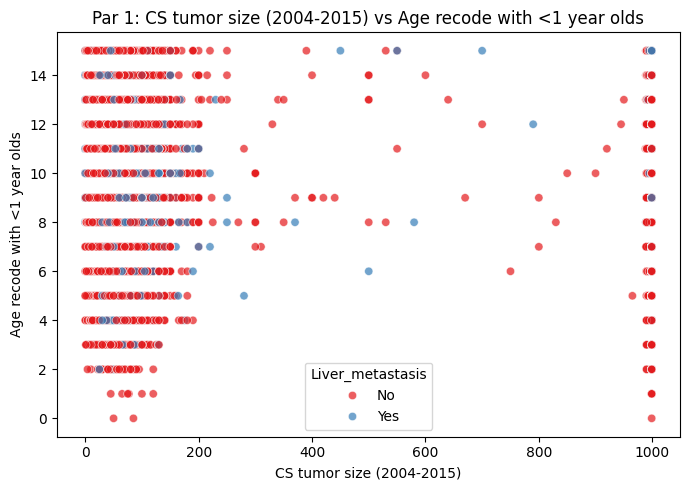

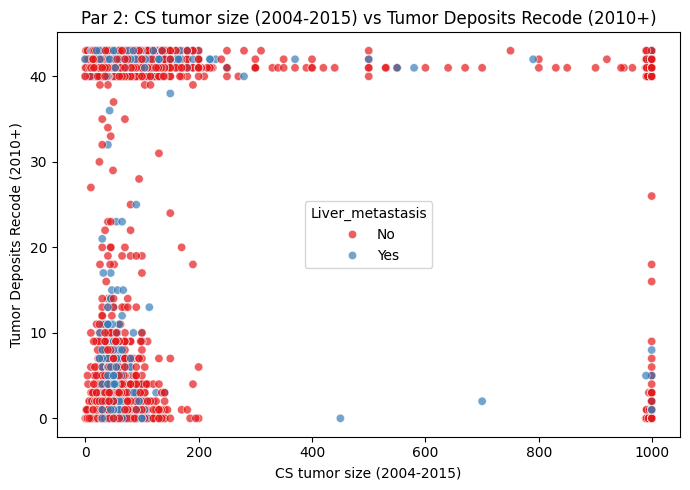

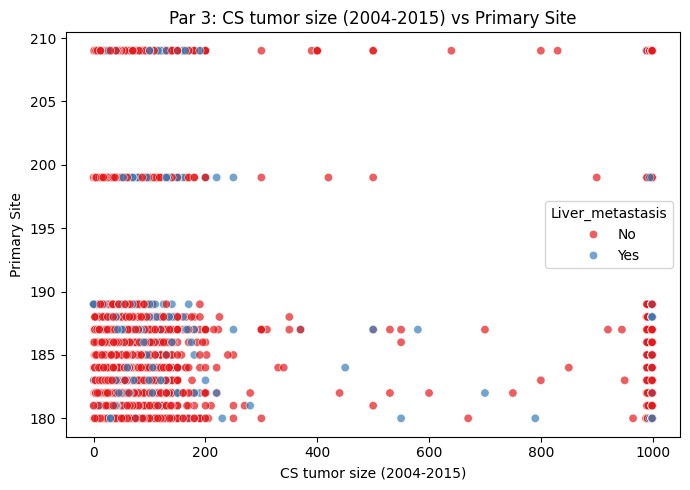

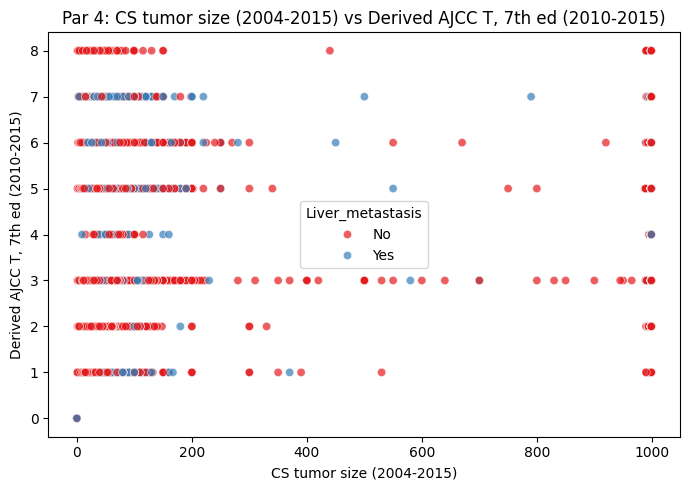

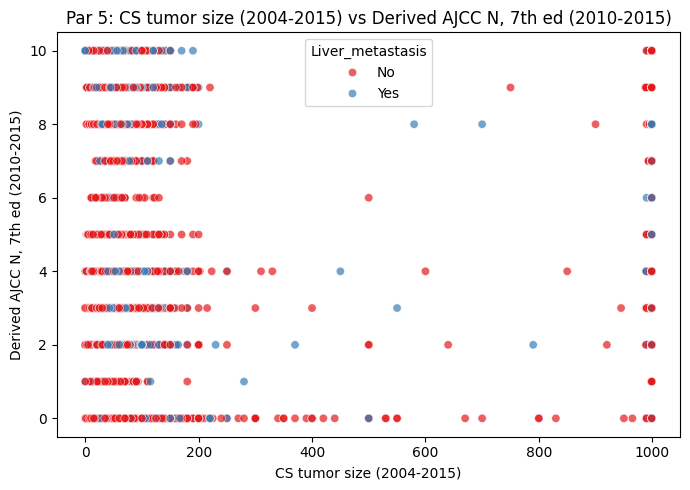

...

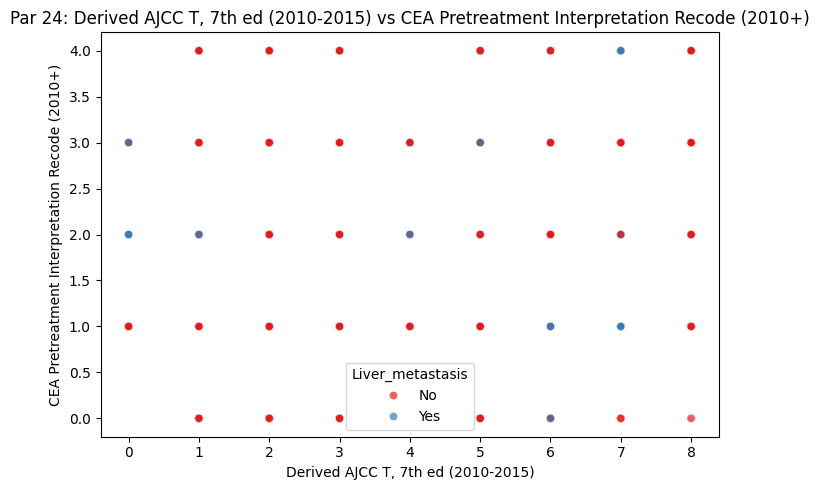

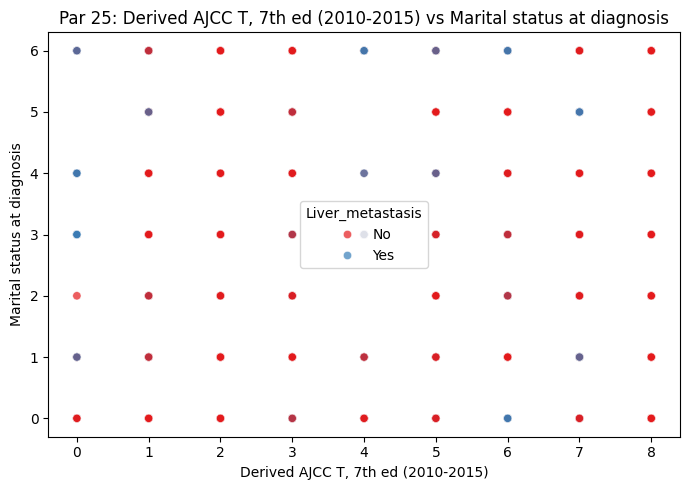

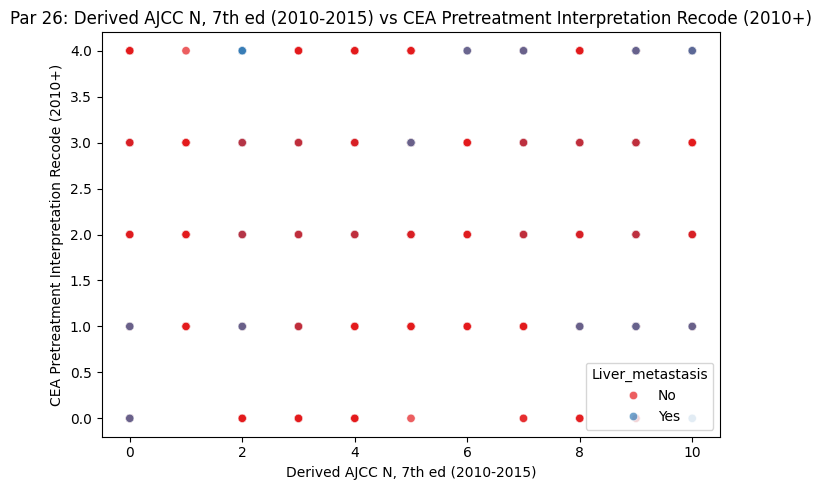

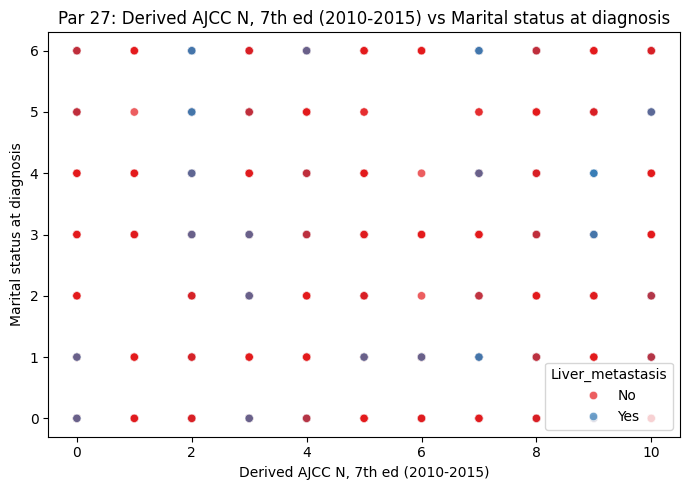

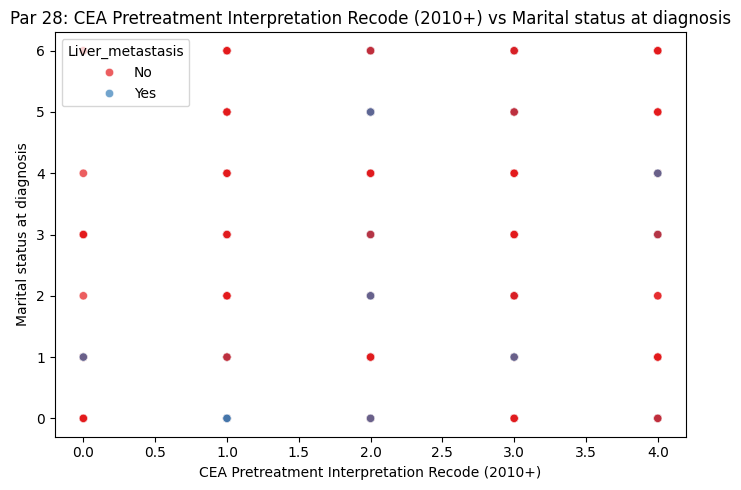

In [1]:
# Carregar o dataset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import itertools

df = pd.read_csv('https://raw.githubusercontent.com/aureavaleria/dataset/refs/heads/main/export.csv')
df.dropna(inplace=True)

# Definir a variável alvo correta
alvo = 'Liver_metastasis'  # <-- Agora com o nome certo

# Definir as variáveis preditoras
X = df[['Age recode with <1 year olds', 'Sex', 'Race recode (White, Black, Other)',
        'Histologic Type ICD-O-3', 'Grade Recode (thru 2017)', 'Primary Site',
        'Derived AJCC T, 7th ed (2010-2015)', 'Derived AJCC N, 7th ed (2010-2015)',
        'CS tumor size (2004-2015)', 'CEA Pretreatment Interpretation Recode (2010+)',
        'Tumor Deposits Recode (2010+)', 'Marital status at diagnosis']]

y = df['SEER Combined Mets at DX-liver (2010+)']

# Codificar variáveis categóricas
for col in X.select_dtypes(include='object').columns:
    X[col] = LabelEncoder().fit_transform(X[col].astype(str))

# Random Forest para selecionar as 8 features mais importantes
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns)
top8 = importances.sort_values(ascending=False).head(8).index.tolist()
print("8 variáveis mais importantes:", top8)

# Gerar as 28 combinações possíveis de scatter plots
combinations = list(itertools.combinations(top8, 2))
print(f"Número de pares possíveis: {len(combinations)}")

for i, (col1, col2) in enumerate(combinations):
    plt.figure(figsize=(7,5))
    sns.scatterplot(
        x=X[col1], y=X[col2],
        hue=y, palette='Set1', alpha=0.7
    )
    plt.title(f'Par {i+1}: {col1} vs {col2}')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.legend(title=alvo)
    plt.tight_layout()
    plt.show()


Número de trios possíveis: 56


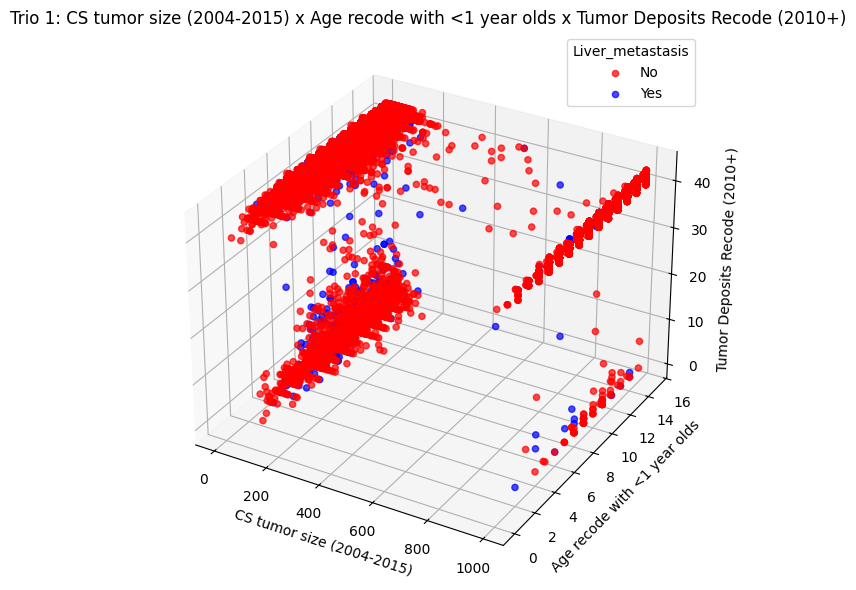

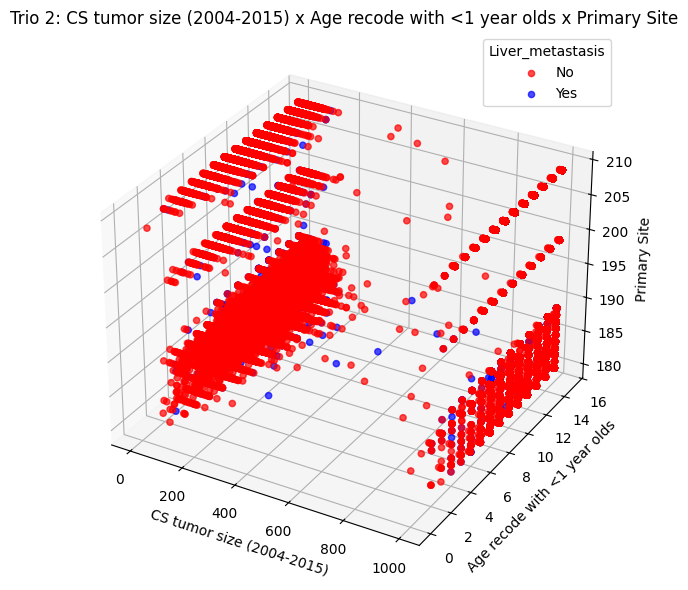

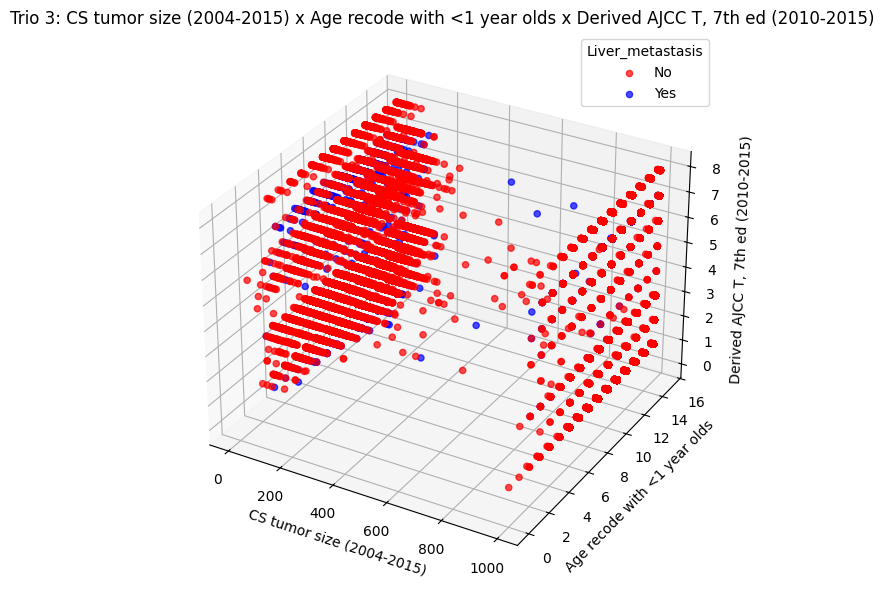

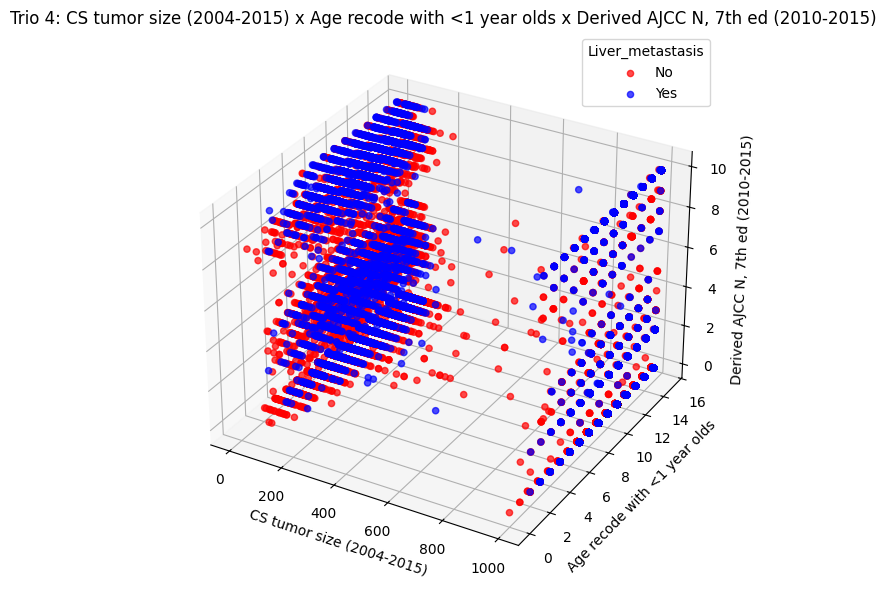

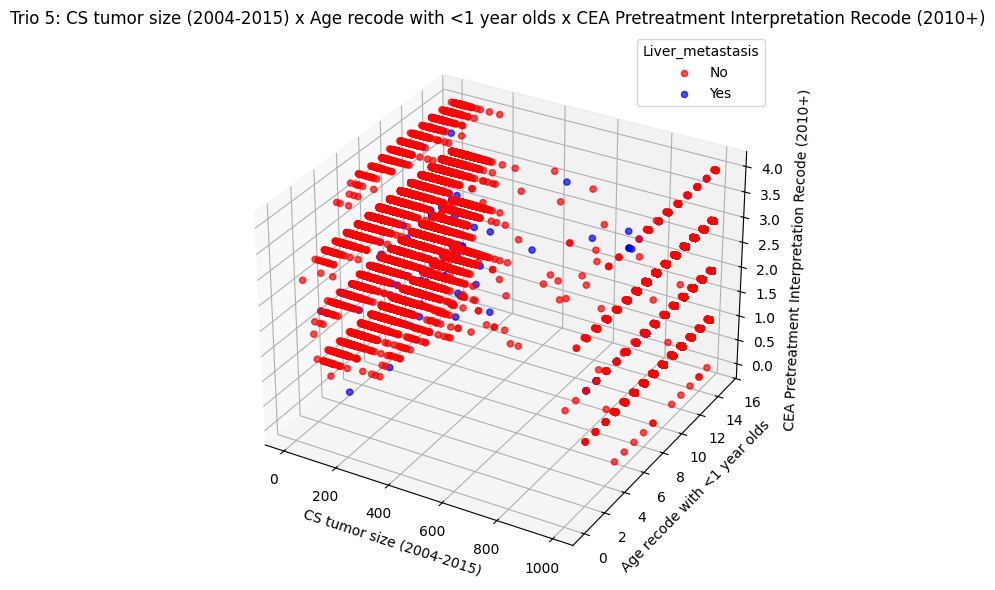

...

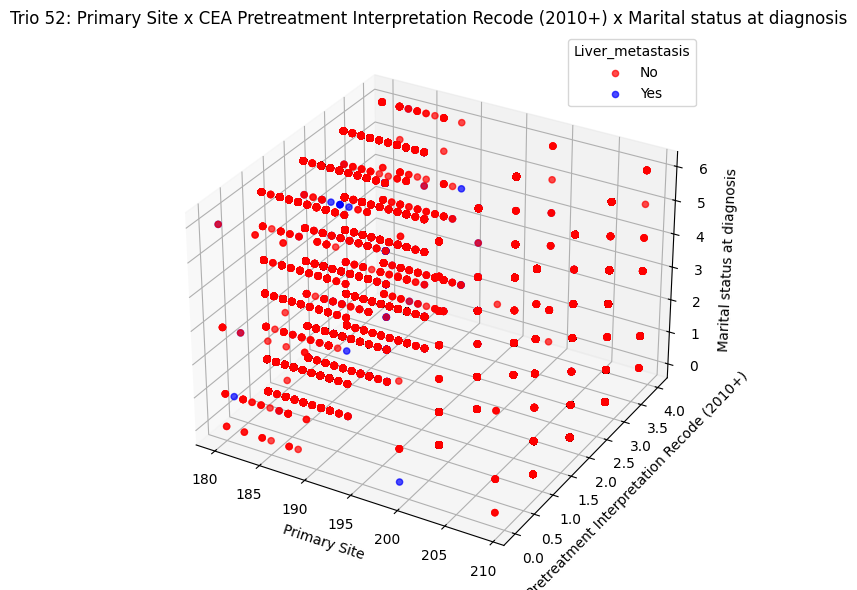

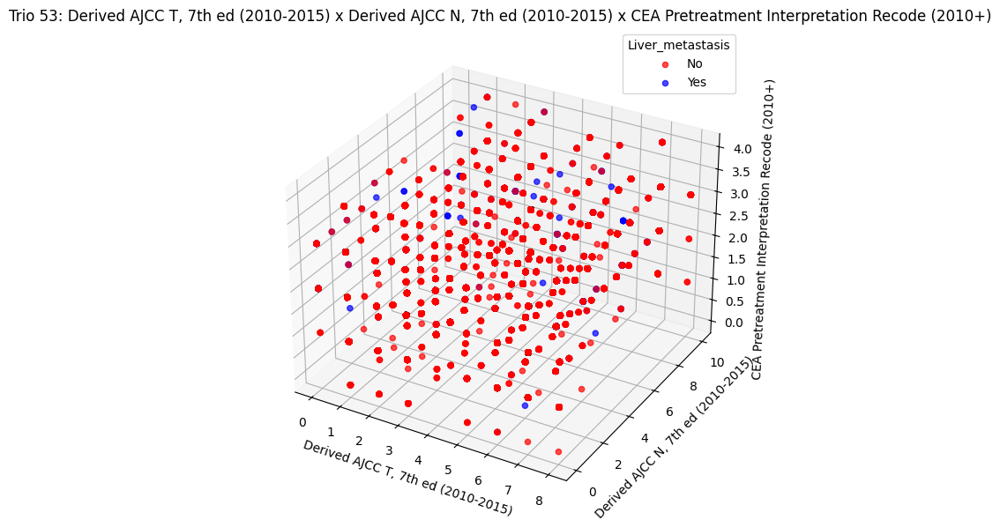

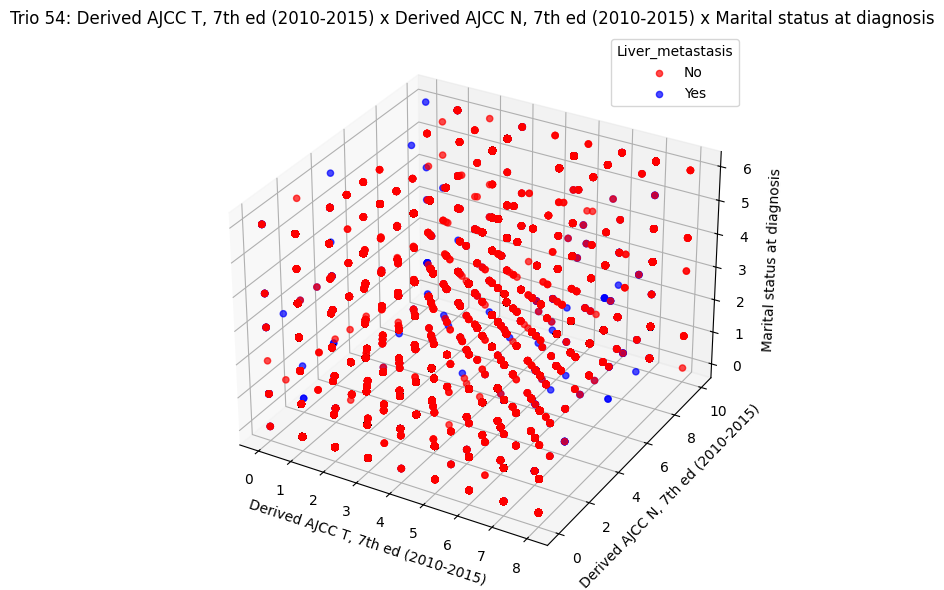

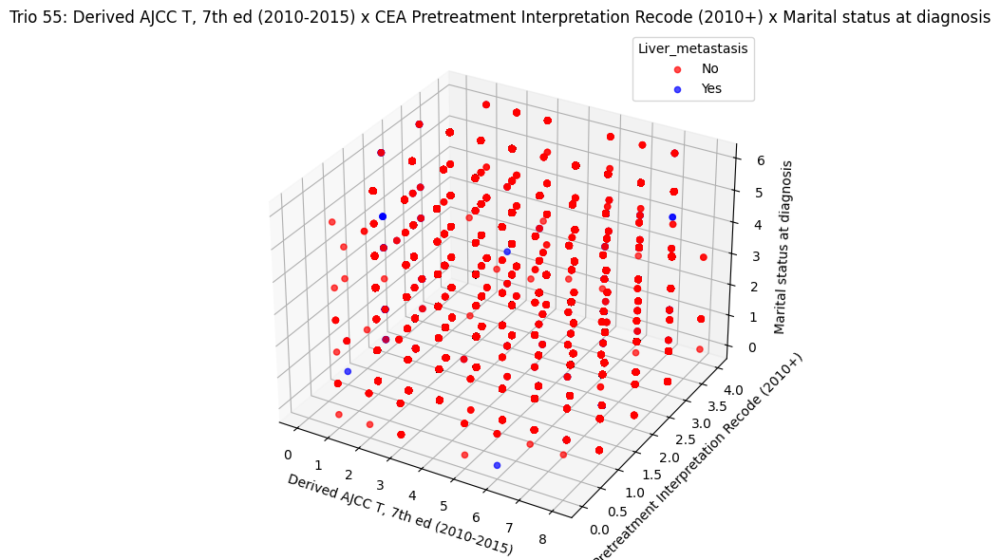

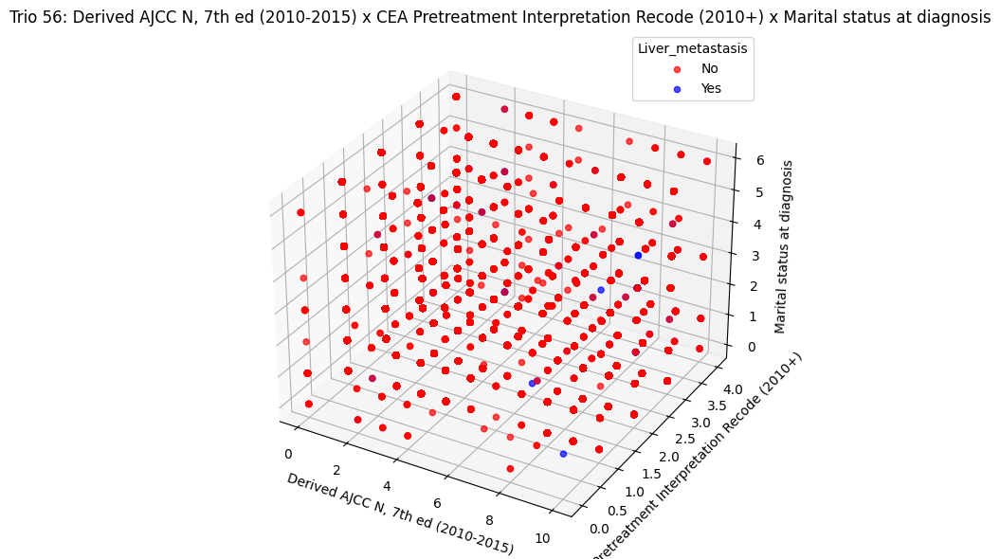

In [2]:
from mpl_toolkits.mplot3d import Axes3D

# Todas as combinações de 3 entre as top8
trios = list(itertools.combinations(top8, 3))
print(f"Número de trios possíveis: {len(trios)}")  # Deve ser 56

for i, (col1, col2, col3) in enumerate(trios):
    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection='3d')
    # Separar por classe para melhorar a visualização
    for cls, color, label in zip(sorted(y.unique()), ['red', 'blue'], ['No', 'Yes']):
        ix = y == cls
        ax.scatter(
            X.loc[ix, col1],
            X.loc[ix, col2],
            X.loc[ix, col3],
            c=color, label=label, alpha=0.7
        )
    ax.set_xlabel(col1)
    ax.set_ylabel(col2)
    ax.set_zlabel(col3)
    ax.set_title(f'Trio {i+1}: {col1} x {col2} x {col3}')
    ax.legend(title=alvo)
    plt.tight_layout()
    plt.show()


In [3]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Juntando X e y em um DataFrame
dados = X.copy()
dados['Classe'] = y.values

# Garantir que 'Classe' está em formato numérico (0=Sem Metástase, 1=Com Metástase)
if dados['Classe'].dtype == 'O':
    dados['Classe'] = LabelEncoder().fit_transform(dados['Classe'])

# Variáveis principais para análise
principais_variaveis = [
    'Age recode with <1 year olds', 'Sex', 'Race recode (White, Black, Other)',
    'Histologic Type ICD-O-3', 'Grade Recode (thru 2017)', 'Primary Site',
    'Derived AJCC T, 7th ed (2010-2015)', 'Derived AJCC N, 7th ed (2010-2015)',
    'CS tumor size (2004-2015)', 'CEA Pretreatment Interpretation Recode (2010+)',
    'Tumor Deposits Recode (2010+)', 'Marital status at diagnosis'
]

# Gerar estatísticas por classe
estatisticas = dados.groupby('Classe')[principais_variaveis].agg(['mean', 'std'])

# Arrumar nomes das colunas para ficar amigável
estatisticas.columns = [f'{var}_{stat}' for var, stat in estatisticas.columns]

# Resetar o índice para a coluna 'Classe' aparecer
estatisticas = estatisticas.reset_index()

print(estatisticas)




   Classe  Age recode with <1 year olds_mean  \
0       0                          11.021749   
1       1                          10.473377   

   Age recode with <1 year olds_std  Sex_mean   Sex_std  \
0                          2.740069  0.521500  0.499543   
1                          2.729946  0.570138  0.495091   

   Race recode (White, Black, Other)_mean  \
0                                2.481937   
1                                2.381065   

   Race recode (White, Black, Other)_std  Histologic Type ICD-O-3_mean  \
0                               1.008639                   8193.383872   
1                               1.108197                   8165.436118   

   Histologic Type ICD-O-3_std  Grade Recode (thru 2017)_mean  ...  \
0                    97.830242                       0.800324  ...   
1                    77.845435                       1.104685  ...   

   Derived AJCC N, 7th ed (2010-2015)_mean  \
0                                 1.887990   
1              

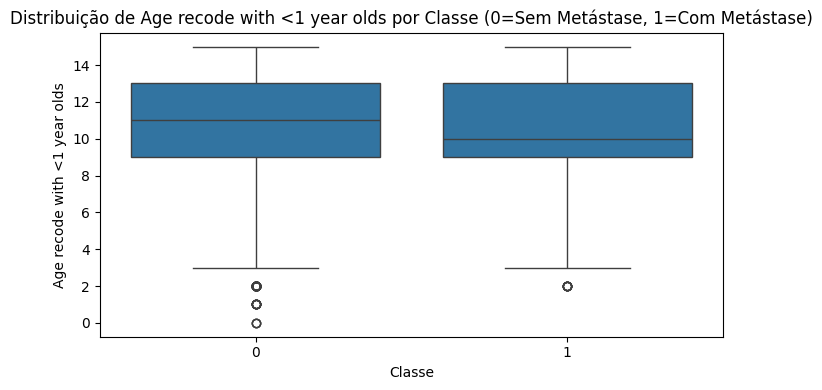

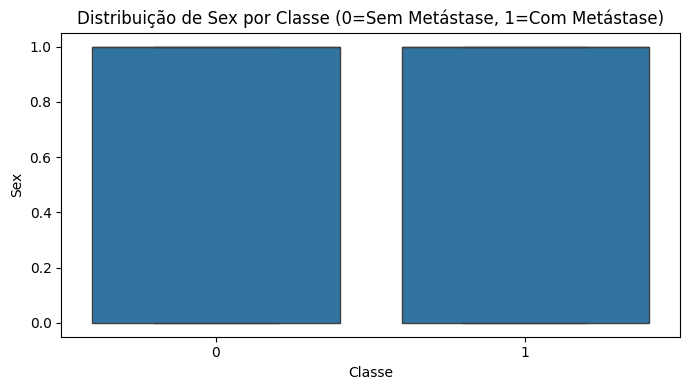

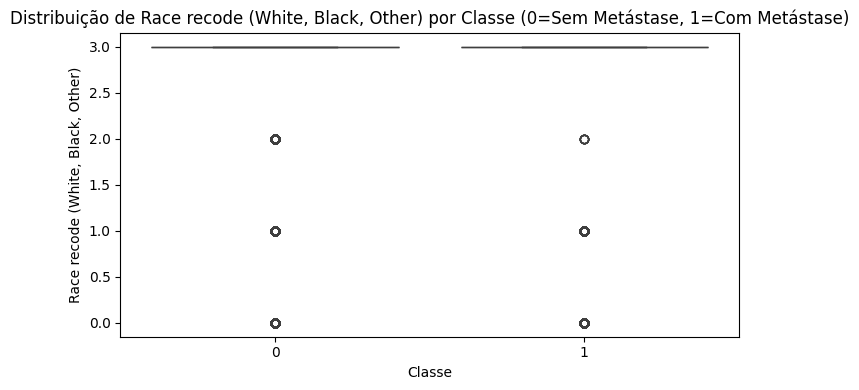

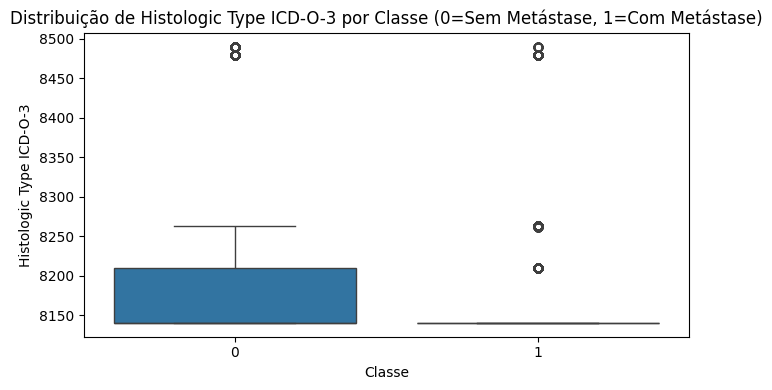

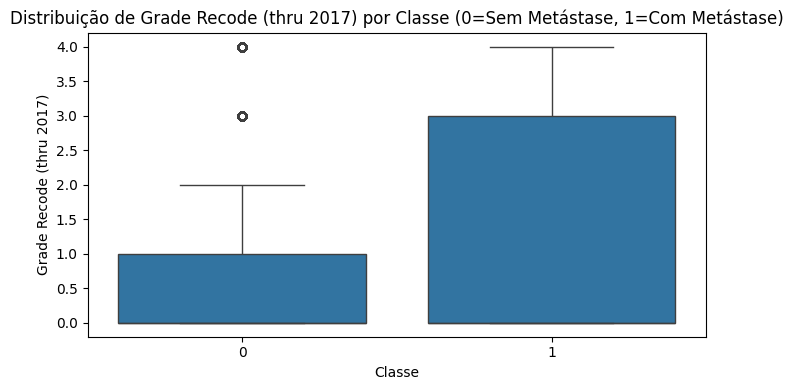

...

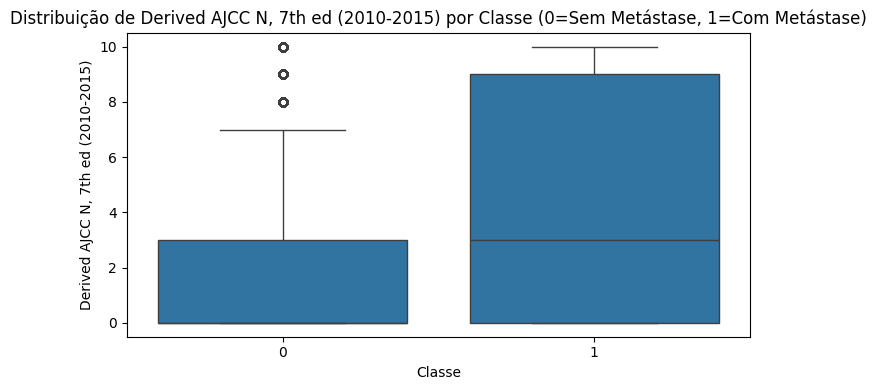

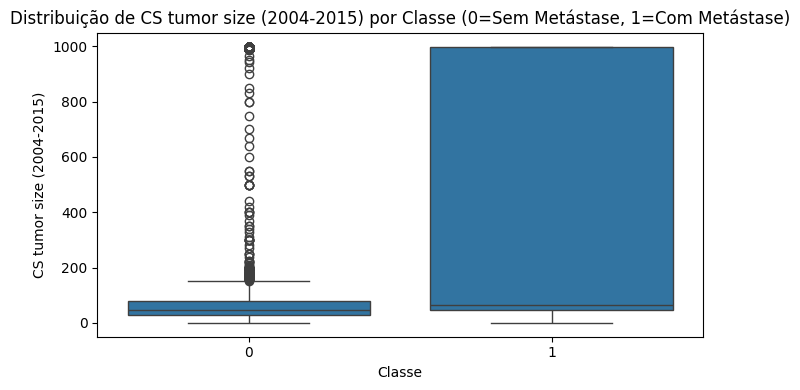

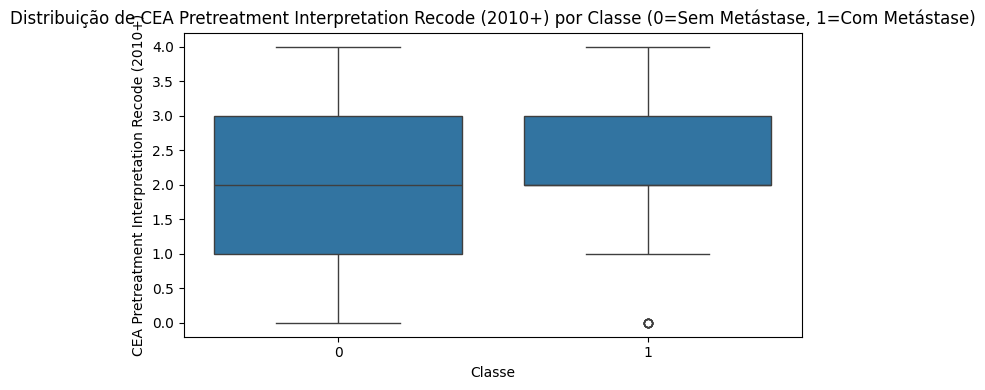

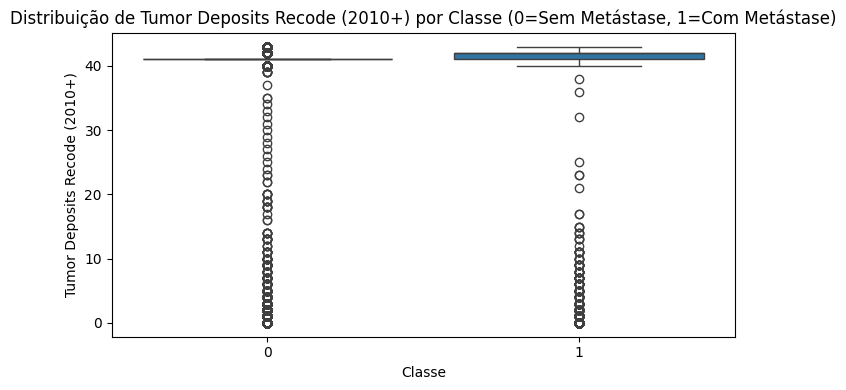

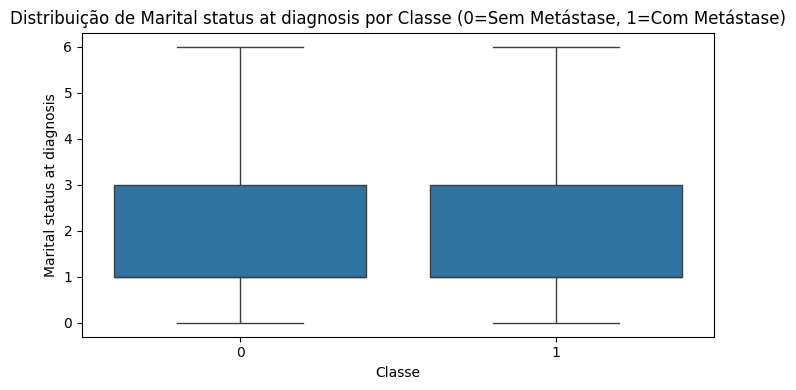

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

for var in principais_variaveis:
    plt.figure(figsize=(7, 4))
    sns.boxplot(x='Classe', y=var, data=dados)
    plt.title(f'Distribuição de {var} por Classe (0=Sem Metástase, 1=Com Metástase)')
    plt.xlabel('Classe')
    plt.ylabel(var)
    plt.tight_layout()
    plt.show()


In [5]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Defina sua variável alvo e os preditores
X_knn = X.copy()
y_knn = dados['Classe']  # ou y se já estiver em 0/1

# Se quiser normalizar as variáveis (recomendado para distância):
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_knn_scaled = scaler.fit_transform(X_knn)

# Parâmetro k (quantos vizinhos)
k = 5

# Pegue os índices dos exemplos minoritários
minority_class = 1  # 1 = com metástase
idx_minority = np.where(y_knn == minority_class)[0]

# Encontre os k vizinhos mais próximos de todos os exemplos
nbrs = NearestNeighbors(n_neighbors=k+1).fit(X_knn_scaled)  # +1 por causa do próprio ponto
distances, indices = nbrs.kneighbors(X_knn_scaled)

# Para cada exemplo minoritário, conte quantos vizinhos são da classe majoritária (classe 0)
majority_counts = []
for idx in idx_minority:
    # Ignora o próprio ponto (primeiro vizinho é o próprio)
    neighbors_classes = y_knn.iloc[indices[idx][1:]]
    majority_count = np.sum(neighbors_classes == 0)
    majority_counts.append(majority_count)

# Percentual de exemplos minoritários com >=5 vizinhos majoritários
pct_overlap = np.mean(np.array(majority_counts) >= 5) * 100

print(f'Em uma análise de vizinhança (k={k}), {pct_overlap:.1f}% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.')

# Percentual de exemplos minoritários com >=5 vizinhos majoritários
pct_overlap = np.mean(np.array(majority_counts) >= 4) * 100

print(f'Em uma análise de vizinhança (k={k}), {pct_overlap:.1f}% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.')

# Percentual de exemplos minoritários com >=5 vizinhos majoritários
pct_overlap = np.mean(np.array(majority_counts) >= 3) * 100

print(f'Em uma análise de vizinhança (k={k}), {pct_overlap:.1f}% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.')


# Percentual de exemplos minoritários com >=5 vizinhos majoritários
pct_overlap = np.mean(np.array(majority_counts) >= 2) * 100

print(f'Em uma análise de vizinhança (k={k}), {pct_overlap:.1f}% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.')

# Percentual de exemplos minoritários com >=5 vizinhos majoritários
pct_overlap = np.mean(np.array(majority_counts) >= 1) * 100

print(f'Em uma análise de vizinhança (k={k}), {pct_overlap:.1f}% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.')


Em uma análise de vizinhança (k=5), 24.1% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.
Em uma análise de vizinhança (k=5), 47.5% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.
Em uma análise de vizinhança (k=5), 68.2% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.
Em uma análise de vizinhança (k=5), 84.3% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.
Em uma análise de vizinhança (k=5), 95.2% dos exemplos da classe minoritária têm pelo menos 5 dos 5 vizinhos pertencentes à classe majoritária.


In [6]:


# Cálculo do Overlap Index: proporção média de vizinhos majoritários ao redor dos exemplos minoritários
overlap_index = np.mean(np.array(majority_counts) / k)
print(f"Índice de sobreposição local (Overlap Index): {overlap_index:.2f} (em uma escala de 0 a 1)")


Índice de sobreposição local (Overlap Index): 0.64 (em uma escala de 0 a 1)
